In [7]:
import pandas as pd
import numpy as np
import re
import scanpy as sc
import anndata
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm import tqdm
import scanpy.external as sce
import scyan
from sklearn.mixture import GaussianMixture
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
def split_adata_by_metadata(adata, metadata_key):

    unique_values = adata.obs[metadata_key].unique()
    adata_list = [adata[adata.obs[metadata_key] == value].copy() for value in unique_values]
    return adata_list


In [3]:
adata_sub=sc.read_h5ad('adata_cm_cd4_leiden_umap.h5ad')
adata_sub.obs_names_make_unique()

In [39]:
adata_sub_list=split_adata_by_metadata(adata_sub,'batch')

/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [40]:
for adata in adata_sub_list:
    gmm = GaussianMixture(n_components=2, random_state=0).fit(adata[:,['CD185 (CXCR5)_logicle']].X)
    labels = gmm.predict(adata[:,['CD185 (CXCR5)_logicle']].X)
    adata.obs['predicted_class']=labels

/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(d

In [41]:
adata_combined = anndata.concat(adata_sub_list)

/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [42]:
sc.set_figure_params(figsize=(8, 8))
p1=scyan.plot.umap(adata_combined, color=['predicted_class'],return_fig=True,ncols=1)
p1.set_size_inches(18.5, 10.5)

AssertionError: Before plotting a UMAP, its coordinates need to be computed using 'scyan.tools.umap(...)' (see https://mics-lab.github.io/scyan/api/representation/#scyan.tools.umap)

/opt/conda/lib/python3.10/site-packages/scyan/plot/_scanpy_plot/umap.py:876: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/opt/conda/lib/python3.10/site-packages/scyan/plot/_scanpy_plot/umap.py:885: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/opt/conda/lib/python3.10/site-packages/scyan/plot/_scanpy_plot/umap.py:876: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/opt/conda/lib/python3.10/site-packages/scyan/plot/_scanpy_plot/umap.py:885: FutureWarning: The default value of 'ignore'

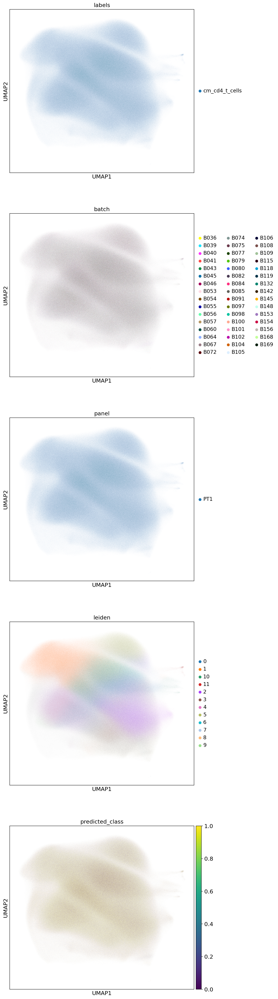

In [15]:
sc.set_figure_params(figsize=(8, 8))
p1=scyan.plot.umap(adata_combined, color=['labels', 'batch','panel','leiden','predicted_class'],return_fig=True,ncols=1)
p1.set_size_inches(18.5, 10.5)

In [43]:
df = sc.get.obs_df(adata_combined, ['CD185 (CXCR5)_logicle','predicted_class'])
df = df.set_index('predicted_class').stack().reset_index()
df.columns = ['predicted_class', 'gene', 'value']
import seaborn as sns


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

<Axes: xlabel='gene', ylabel='value'>

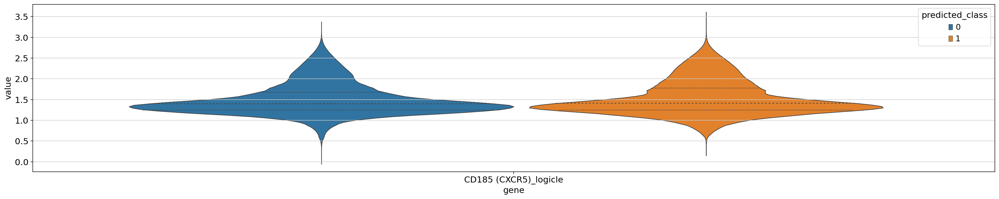

In [44]:
import matplotlib.pyplot as plt
plt.figure(figsize=(28,5))
sns.violinplot(data=df, x='gene', y='value', hue="predicted_class",
                 inner="quart", linewidth=1)   

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


<Axes: xlabel='gene', ylabel='value'>

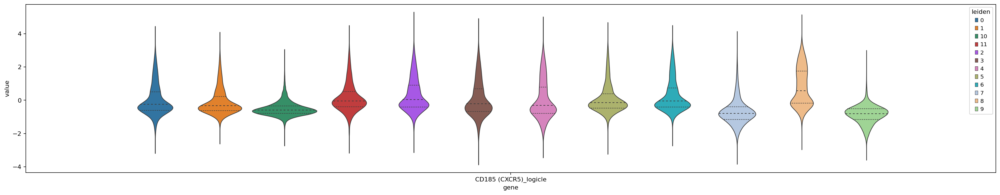

In [9]:

df = sc.get.obs_df(adata_sub, ['CD185 (CXCR5)_logicle','leiden'])
df = df.set_index('leiden').stack().reset_index()
df.columns = ['leiden', 'gene', 'value']

plt.figure(figsize=(28,5))
sns.violinplot(data=df, x='gene', y='value', hue="leiden",
                 inner="quart", linewidth=1)  

In [4]:
adata_sub_subsampled=sc.pp.subsample(adata_sub, n_obs=100000, random_state=0, copy=True)

/opt/conda/lib/python3.10/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/opt/conda/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarnin

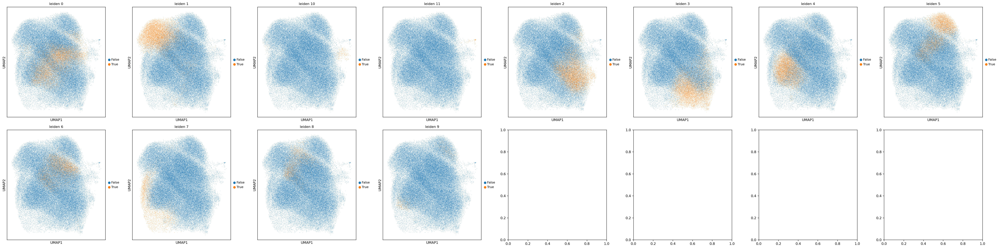

In [8]:
import math
AIFI_L3_categories = adata_sub_subsampled.obs['leiden'].cat.categories

n_categories = len(AIFI_L3_categories)

n_columns = 8
n_rows = math.ceil(n_categories / n_columns)

fig, axs = plt.subplots(n_rows, n_columns, figsize=(5 * n_columns, 5 * n_rows))

for i, category in enumerate(AIFI_L3_categories):
    row = i // n_columns
    col = i % n_columns
    adata_sub_subsampled.obs['cluster_dummy'] = adata_sub_subsampled.obs['leiden'] == category
    adata_sub_subsampled.obs['cluster_dummy']=[str(item) for item in adata_sub_subsampled.obs['cluster_dummy']]
    sc.pl.umap(adata_sub_subsampled, color='cluster_dummy', title=f'leiden {category}', ax=axs[row, col], show=False)

plt.tight_layout()
plt.show()